# Limonene Biofuel Study

In this notebook we demonstrate the usage of the Automatic Recommendation Tool (ART) to recommend strain designs for improving limonene production.

In this case we have proteomics data which will be used to determine maximum production of limonene in terms of total protein concentrations. Then target protein concentrations will be reported back to the user.


Tested using **ART_3.9.4** kernel on jprime.lbl.gov.

#### Files generated by running this notebook:

- a pickle file containing a trained ART object
- files containing predictive accuracy metrics
- plot of (cross-validated) predictions vs observations for the train data set
- `draws.txt`, containing all draws from the optimization procedure
- `recommendations.csv`, containing the ART recommendations for the next cycle
- plots of predictive distributions for the recommendations
- plots of success probabilities for the recommendations


## Setup

The first step is to make sure the `ART` library is available in your kernel.

Clone the corresponding git repository:


`git clone https://github.com/JBEI/AutomatedRecommendationTool.git`

or pull the latest version.

Information about licensing ART is available at https://github.com/JBEI/ART.



We can then add library to the path and do the necessary import:


In [1]:
import os
import sys
sys.path.append('../../src')        # Make sure this is the location for the ART library

import warning_utils
warning_utils.filter_end_user_warnings()

from art.core import RecommendationEngine
from art.utility import load_study
from art import plot


Load EDD study into a dataframe:

In [2]:
# Strongly recommended workflow is to *greatly* reduce preprocessing work by loading
# standardized data from the [Experiment Data Depot (EDD)](https://pubs.acs.org/doi/10.1021/acssynbio.7b00204).
# To skip the EDD registration step for new ART users & support automated notebook testing,
# load a data file downloaded from EDD instead.
load_from_edd = False

if load_from_edd:
    # Load data from EDD:
    #   * Bespoke data formats from well-meaning collaborators explode in complexity very quickly.
    #   * "Slug" is the final URL portion.  For this study, full URL is https://public-edd.jbei.org/s/pcap/
    edd_study_slug = 'pcap'
    edd_server = 'public-edd.jbei.org'
    df = load_study(edd_study_slug=edd_study_slug,edd_server=edd_server, default_to_system_user=False)
else:
    df = load_study(data_file="../../data/Limonene_data_for_ART.csv")


In [3]:
df.head()

,Unnamed: 0,Study ID,Study Name,Line ID,Replicate Key,Line Name,Line Description,Protocol,Assay ID,Assay Name,Formal Type,Measurement Type,Compartment,Units,Value,Hours
0,0,2843,Principal Component Analysis for Proteomics (P...,2844,768a1508-6a41-4c8e-a61b-0dc271381b07,2X-Mh,DH1 with two plasmid (medium + high copy) expr...,GC-MS,2874,2X-Mh,NaN,Limonene,2,mg/L,75.39261,24.0
1,1,2843,Principal Component Analysis for Proteomics (P...,2845,a810f8d4-4648-4272-a1c5-6dd2200cb8ff,B-Lm,DH1 with single plasmid (medium-copy) expressi...,GC-MS,2875,B-Lm,NaN,Limonene,2,mg/L,12.75786,24.0
2,2,2843,Principal Component Analysis for Proteomics (P...,2846,569fb1c4-3aa1-4209-903d-0bca3acd793f,BL-Mm,DH1 with two plasmid (B + high with extra copy...,GC-MS,2876,BL-Mm,NaN,Limonene,2,mg/L,119.81367,24.0
3,3,2843,Principal Component Analysis for Proteomics (P...,2847,dbebc6b2-ecac-4675-bae3-965080cecb12,2X-Ll,DH1 with two plasmid (medium + high copy) expr...,GC-MS,2877,2X-Ll,NaN,Limonene,2,mg/L,5.98466,24.0
4,4,2843,Principal Component Analysis for Proteomics (P...,2848,8def5195-6d31-493d-bd40-5da7f5c91798,A-Mm,DH1 with single plasmid (high-copy) expression...,GC-MS,2878,A-Mm,NaN,Limonene,2,mg/L,9.66957,24.0


Create Cycle 1 data by excluding 3 data points that were added to the initial study

In [4]:
df_cycle1 = df.copy()
df_cycle1 = df_cycle1[~df_cycle1['Line Name'].isin(['BL-Mm', 'BL-Ml', 'BL-Mh'])]

Create test data for Cycle 1

In [5]:
df_test = df.copy()
df_test = df_test[df_test['Line Name'].isin(['BL-Mm', 'BL-Ml', 'BL-Mh'])]

## Cycle 1

Next we define a dictionary that contains all of the settings that ART will use to find the recommendations.

In [6]:
art_params = {
    'input_vars': [
        'ATOB_ECOLI',
        'ERG8_YEAST',
        'IDI_ECOLI',
        'KIME_YEAST',
        'MVD1_YEAST',
        'Q40322_MENSP',
        'Q8LKJ3_ABIGR',
        'Q9FD86_STAAU',
        'Q9FD87_STAAU'
    ],
    'response_vars': ['Limonene'],
    'objective': 'maximize',
    'cross_val_partitions': 10,
    'threshold': 0.2,
    'num_recommendations': 10,
    'verbose': 1,
    'seed': 10,
    'output_dir': '../../results/Limonene',
    'last_dashes_denote_replicates': False,
    'max_mcmc_cores': 2,
    'result_suffix': '_C1',
}


The objective is to predict strain designs which will **maximize** production. Successful designs are considered to be those that exceed the maximum observed production by 20%, as specified by the `threshold` variable.


ART identified 27 unique designs in the training data. 
Correctly communicating your designs is critical to building ART's model and to cross-validation.  We strongly suggest verifying ART's interpretation of your designs by inspecting the preprocessed DataFrame.  For example, if your ART instance is named `engine`, run `engine.df["Design"]`.  See Data Preparation docs for a description of how ART infers design information. https://lbl-biosci.gitlab.io/ese/art/Data_Preparation/#labeling-lines-designs-replicates-oh-my
Cross-validating models…
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_cla

Version 0.12.2 of tpot is outdated. Version 1.1.0 was released Thursday July 03, 2025.


Best pipeline: ElasticNetCV(GradientBoostingRegressor(ExtraTreesRegressor(XGBRegressor(input_matrix, learning_rate=0.01, max_depth=5, min_child_weight=10, n_estimators=100, n_jobs=1, objective=reg:squarederror, subsample=0.9000000000000001, verbosity=0), bootstrap=False, max_features=0.7000000000000001, min_samples_leaf=2, min_samples_split=4, n_estimators=100), alpha=0.95, learning_rate=1.0, loss=huber, max_depth=5, max_features=0.8, min_samples_leaf=8, min_samples_split=3, n_estimators=100, subsample=0.05), l1_ratio=0.25, tol=1e-05)
Done fitting L0 models in 3818.47 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 2737 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 2738.22 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: LinearSVR(ZeroCount(FastICA(input_matrix, tol=0.15000000000000002)), C=25.0, dual=True, epsi

/app.venv/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Done fitting L0 models in 128.33 s


/app.venv/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warning

Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 14 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 14.95 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: AdaBoostRegressor(Normalizer(SelectPercentile(input_matrix, percentile=69), norm=l1), learning

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 16 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 17.12 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: DecisionTreeRegressor(ElasticNetCV(input_matrix, l1_ratio=0.9500000000000001, tol=0.0001), max

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 14 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 367.01 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor


Version 0.12.2 of tpot is outdated. Version 1.1.0 was released Thursday July 03, 2025.


Best pipeline: ElasticNetCV(DecisionTreeRegressor(XGBRegressor(ElasticNetCV(input_matrix, l1_ratio=0.45, tol=0.01), learning_rate=0.1, max_depth=6, min_child_weight=9, n_estimators=100, n_jobs=1, objective=reg:squarederror, subsample=0.6000000000000001, verbosity=0), max_depth=7, min_samples_leaf=8, min_samples_split=14), l1_ratio=0.30000000000000004, tol=0.1)
Done fitting L0 models in 3682.72 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Best pipeline: AdaBoostRegressor(XGBRegressor(StandardScaler(Normalizer(input_matrix, norm=l1)), learning_rate=0.001, max_depth=5, min_child_weight=20, n_estimators=100, n_jobs=1, objective=reg:squarederror, subsample=0.6500000000000001, verbosity=0), learning_rate=0.1, loss=linear, n_estimators=100)
Done fitting L0 models in 3660.78 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 19 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 19.31 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor


Version 0.12.2 of tpot is outdated. Version 1.1.0 was released Thursday July 03, 2025.


Best pipeline: ExtraTreesRegressor(RBFSampler(MaxAbsScaler(Normalizer(input_matrix, norm=l1)), gamma=0.45), bootstrap=False, max_features=0.7000000000000001, min_samples_leaf=5, min_samples_split=14, n_estimators=100)
Done fitting L0 models in 7348.63 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 12 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 12.28 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor


Version 0.12.2 of tpot is outdated. Version 1.1.0 was released Thursday July 03, 2025.


Best pipeline: SGDRegressor(AdaBoostRegressor(LinearSVR(PCA(input_matrix, iterated_power=8, svd_solver=randomized), C=25.0, dual=False, epsilon=0.0001, loss=squared_epsilon_insensitive, tol=0.1), learning_rate=0.1, loss=square, n_estimators=100), alpha=0.0, eta0=0.01, fit_intercept=True, l1_ratio=0.5, learning_rate=constant, loss=huber, penalty=elasticnet, power_t=0.1)
Done fitting L0 models in 1633.24 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 14 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 14.50 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor


Version 0.12.2 of tpot is outdated. Version 1.1.0 was released Thursday July 03, 2025.


Best pipeline: XGBRegressor(SGDRegressor(KNeighborsRegressor(input_matrix, n_neighbors=1, p=1, weights=distance), alpha=0.0, eta0=0.1, fit_intercept=True, l1_ratio=0.0, learning_rate=constant, loss=huber, penalty=elasticnet, power_t=100.0), learning_rate=1.0, max_depth=10, min_child_weight=1, n_estimators=100, n_jobs=1, objective=reg:squarederror, subsample=0.9500000000000001, verbosity=0)
Done fitting L0 models in 84.87 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 15.77 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor


Version 0.12.2 of tpot is outdated. Version 1.1.0 was released Thursday July 03, 2025.


Best pipeline: AdaBoostRegressor(SelectFwe(SelectFwe(AdaBoostRegressor(input_matrix, learning_rate=1.0, loss=square, n_estimators=100), alpha=0.016), alpha=0.011), learning_rate=0.1, loss=linear, n_estimators=100)
Done fitting L0 models in 9877.42 s
Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 13 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 13.74 s
Done with 10-fold cross-validation in 37376.34 s


,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,23.851579,246.976228,20.570042,992.024470,-0.138856
Random Forest Regressor,20.958144,219.454156,16.220850,702.359775,0.193682
Support Vector Regressor,22.672080,168.477250,22.602414,1024.892333,-0.176589
Kernel Ridge Regressor,16.308900,116.680979,16.178472,527.723190,0.394167
K-NN Regressor,21.080870,243.864902,17.907046,765.065410,0.121696
Gaussian Process Regressor,20.326089,244.510548,15.606265,656.705399,0.246094
Gradient Boosting Regressor,21.484858,212.129307,19.472358,840.771849,0.034784
TPOT Regressor,19.978443,179.363593,20.493914,819.138682,0.059619
Ensemble Model (L1),18.801591,184.542123,17.461966,658.420091,0.244126


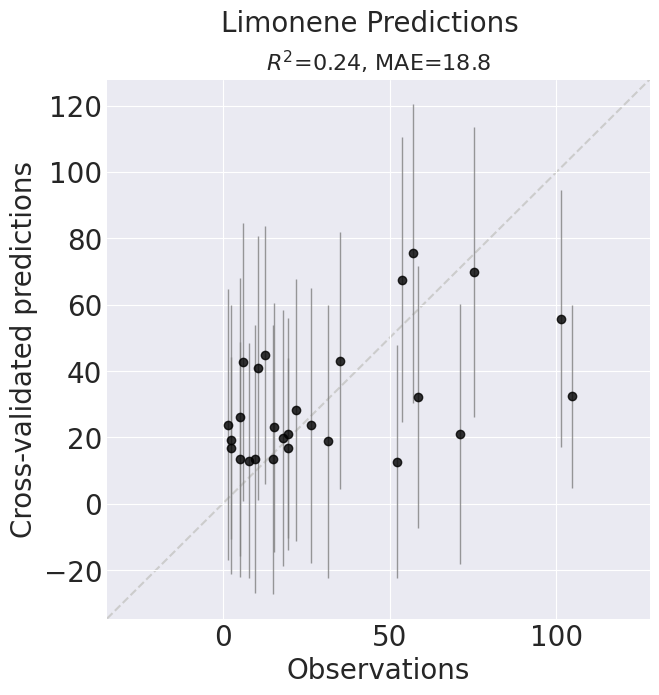

Building models…
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: KNeighborsRegressor(input_matrix, n_neighbors=1, p=1, weights=distance)
Done fitting L0 models in 91.86 s
Building en

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 16 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 17.07 s


,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,0.076212,0.367732,0.119131,2.000036e-02,0.999977
Random Forest Regressor,6.930880,66.874642,5.549354,7.883243e+01,0.909499
Support Vector Regressor,20.702417,149.168889,22.123580,9.180428e+02,-0.053924
Kernel Ridge Regressor,10.695350,75.436142,11.327509,2.427030e+02,0.721374
K-NN Regressor,15.035582,177.427278,12.901354,3.925137e+02,0.549389
Gaussian Process Regressor,0.000401,0.003122,0.000485,3.959855e-07,1.000000
Gradient Boosting Regressor,0.062616,0.499297,0.042470,5.724422e-03,0.999993
TPOT Regressor,0.000000,0.000000,0.000000,0.000000e+00,1.000000
Ensemble Model (L1),3.153445,29.862511,3.399545,2.150112e+01,0.975316


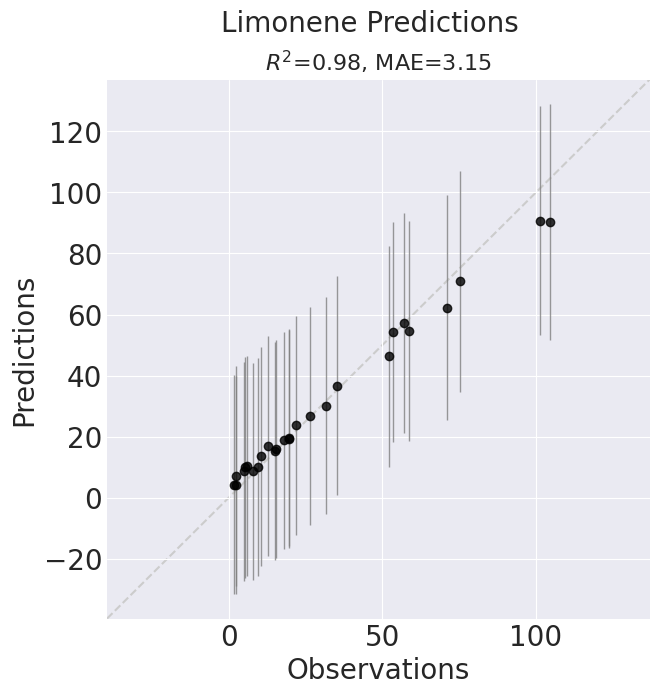

Done building models in 116.52 s
Starting parallel tempering using 2 chains…
Done with parallel tempering in 6917.00 s
Choosing recommendations (19,800 candidates)…


Done choosing recommendations in 0.02 s


,ATOB_ECOLI,ERG8_YEAST,IDI_ECOLI,KIME_YEAST,MVD1_YEAST,Q40322_MENSP,Q8LKJ3_ABIGR,Q9FD86_STAAU,Q9FD87_STAAU,Limonene
0,0.160777,0.156325,2.907119,0.415631,1.287635,10.717587,4.624238,0.447536,0.571475,109.414310
1,0.216763,0.140095,2.419495,0.411578,1.456956,10.812343,4.579518,0.437313,0.553951,108.599192
2,0.212913,0.177038,2.420735,0.411761,1.453186,10.812455,4.582083,0.436868,0.554065,108.535862
3,0.178071,0.195697,2.577847,0.409517,0.609982,10.444420,4.659364,0.435872,0.680253,108.481173
4,0.166838,0.142186,2.602217,0.414633,0.681832,10.308931,4.657494,0.487376,0.755503,108.368315
5,0.180893,0.274505,2.700581,0.410036,1.155168,10.206640,4.652300,0.420820,0.641971,108.262151
6,0.205695,0.230866,2.845366,0.393298,0.352347,10.627056,4.719961,0.441213,0.554797,108.225837
7,0.204336,0.133417,2.614462,0.412057,0.730509,10.733386,4.603738,0.536313,0.652842,108.207550
8,0.192401,0.203982,2.634679,0.413797,0.864248,10.756813,4.313975,0.433313,0.570228,108.196603
9,0.187594,0.210568,2.563824,0.393390,1.052178,10.235833,4.739516,0.486971,0.591106,108.161300


Sampling: [y]


Computing success probabilities…
Sampling posterior predictive distributions…


Sampling: [y]


Done sampling in 0.55 s
Done computing success probabilities in 0.55 s
Sampling posterior predictive distributions…
Done sampling in 0.56 s


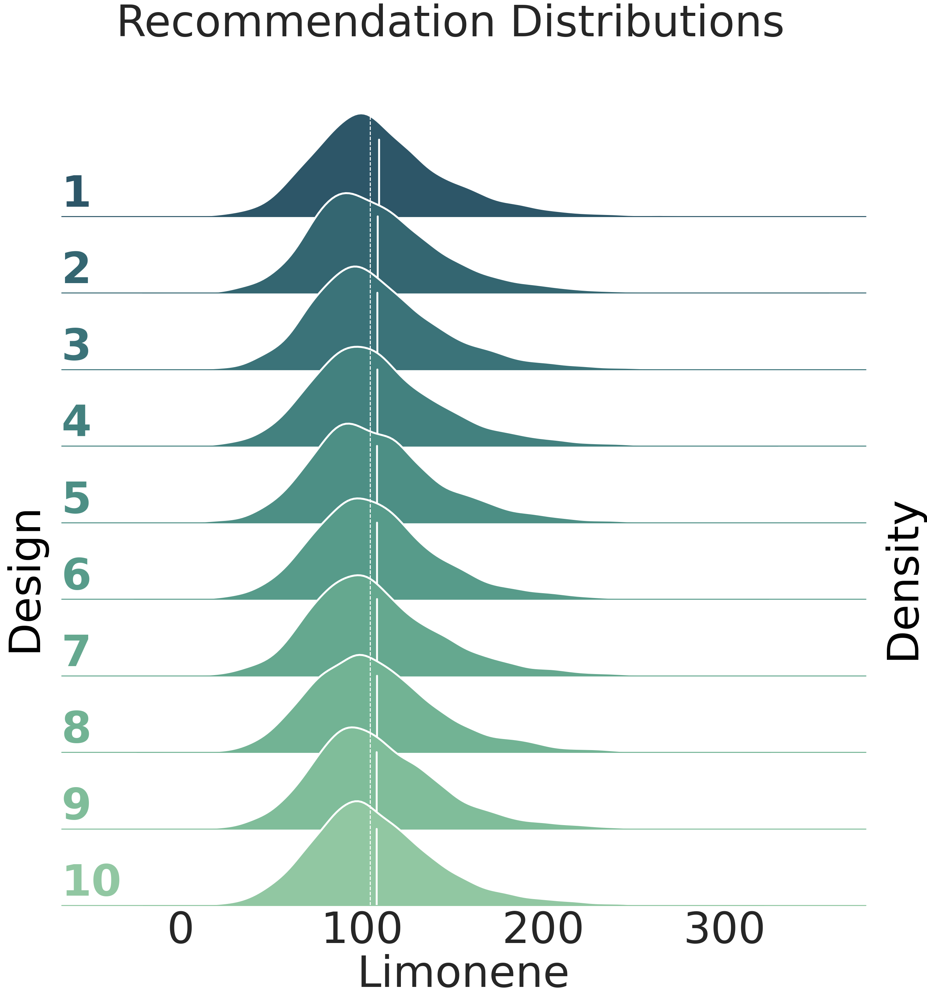

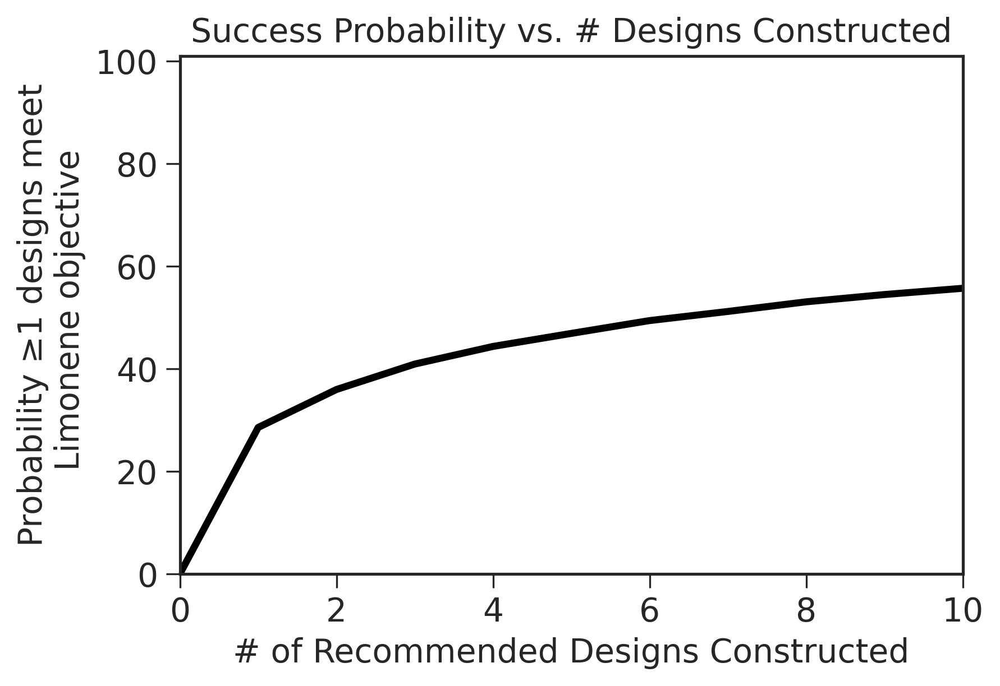

In [7]:
art = RecommendationEngine(df=df_cycle1, **art_params)

Create an object for the test data

In [8]:
# Copy and update art_params so we can change several
#  without affecting subsequent use below.
test_params = dict(art_params)
test_params['build_model'] = False
test_params["cross_val_partitions"] = 3

# Create the RecommendationEngine
art_test = RecommendationEngine(df=df_test, **test_params)
art_test.df

ART identified 3 unique designs in the training data. 
Correctly communicating your designs is critical to building ART's model and to cross-validation.  We strongly suggest verifying ART's interpretation of your designs by inspecting the preprocessed DataFrame.  For example, if your ART instance is named `engine`, run `engine.df["Design"]`.  See Data Preparation docs for a description of how ART infers design information. https://lbl-biosci.gitlab.io/ese/art/Data_Preparation/#labeling-lines-designs-replicates-oh-my


Design Input Variables                                             \
                      ATOB_ECOLI ERG8_YEAST IDI_ECOLI KIME_YEAST MVD1_YEAST   
Line Name                                                                     
BL-Mh      BL-Mh         1.95983    0.78130   2.59550    1.42496    4.10495   
BL-Ml      BL-Ml         0.24012    0.19050   0.94884    0.38070    1.30811   
BL-Mm      BL-Mm         1.25540    0.58985   2.29065    1.04860    3.19300   

                                                               \
          Q40322_MENSP Q8LKJ3_ABIGR Q9FD86_STAAU Q9FD87_STAAU   
Line Name                                                       
BL-Mh         13.59919      1.86762      0.39057      0.65389   
BL-Ml          2.72406      0.11237      0.05002      0.08503   
BL-Mm         11.31405      1.63235      0.25975      0.41045   

          Response Variables  
                    Limonene  
Line Name                     
BL-Mh              127.99494  
BL-Ml                6.72018  
BL-Mm              119.81367

We can evaluate models on the test data specifically:

In [9]:
X_test = art_test.df['Input Variables'].values
y_test = art_test.df['Response Variables'].values
art.evaluate_models(X_test, y_test)


,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,291.757069,593.284976,158.983643,110397.986166,-35.045526
Random Forest Regressor,39.483914,141.317376,11.980547,1702.512938,0.444121
Support Vector Regressor,74.096364,119.781804,43.479950,7380.777219,-1.409863
Kernel Ridge Regressor,83.062916,74.268374,57.744805,10233.910556,-2.341426
K-NN Regressor,54.141485,177.921410,18.353236,3268.141640,-0.067066
Gaussian Process Regressor,68.196212,144.421284,34.906721,5869.202473,-0.916326
Gradient Boosting Regressor,36.571311,210.703630,3.530707,1349.926648,0.559242
TPOT Regressor,32.854873,33.702223,22.392580,1580.870361,0.483837
Ensemble Model (L1),23.961185,82.840850,7.378011,628.573427,0.794767


[                                                                   Predictions  \
 Name                                                                             
 Neural Regressor             [583.4621274880736, 83.15704142090142, 463.180...   
 Random Forest Regressor      [75.9808670999999, 30.06244570000001, 76.71826...   
 Support Vector Regressor     [19.152246510840044, 19.508445186728597, 19.15...   
 Kernel Ridge Regressor       [2.2692148661135853e-05, 8.261781371791141, 0....   
 K-NN Regressor                                 [57.00183, 35.339684, 57.00183]   
 Gaussian Process Regressor   [31.138562962962965, 25.777331920875213, 31.13...   
 Gradient Boosting Regressor  [88.5167401872279, 45.35391509965886, 88.21167...   
 TPOT Regressor                                   [75.39261, 5.17895, 75.39261]   
 Ensemble Model (L1)          [99.09360103946945, 20.25209590458192, 90.3633...   
 
                                     MAE     MRAE(%)       StdAE  \
 Name            

Plot observations vs. posterior predictive distributions for the train (black) and test (blue) data.

Cross-validated data:

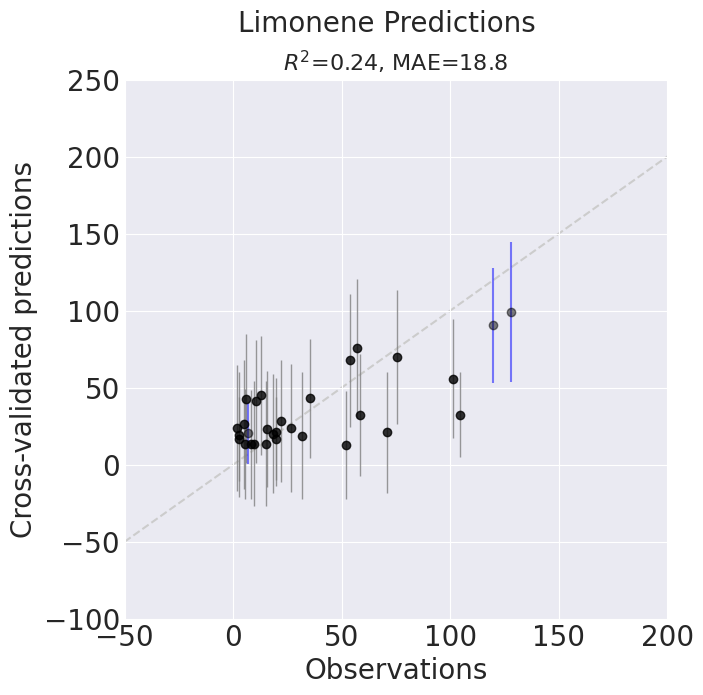

In [10]:
plot.predictions_vs_observations(art, cv=True, error_bars=True,
                                 X_test=X_test, y_test=y_test,
                                 x_limits=[[-50, 200]], y_limits=[[-100, 250]])

Train data:

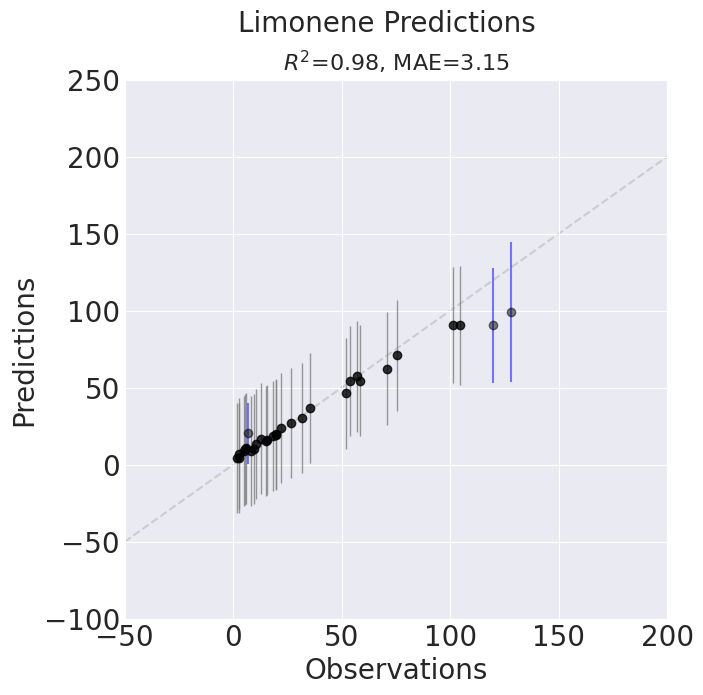

In [11]:
plot.predictions_vs_observations(art, cv=False, error_bars=True,
                                 X_test=X_test, y_test=y_test,
                                 x_limits=[[-50, 200]], y_limits=[[-100, 250]])

To show violin plots representing the predictive probability distribution instead of error bars run:

Sampling: [y]


Sampling posterior predictive distributions…
Done sampling in 0.55 s


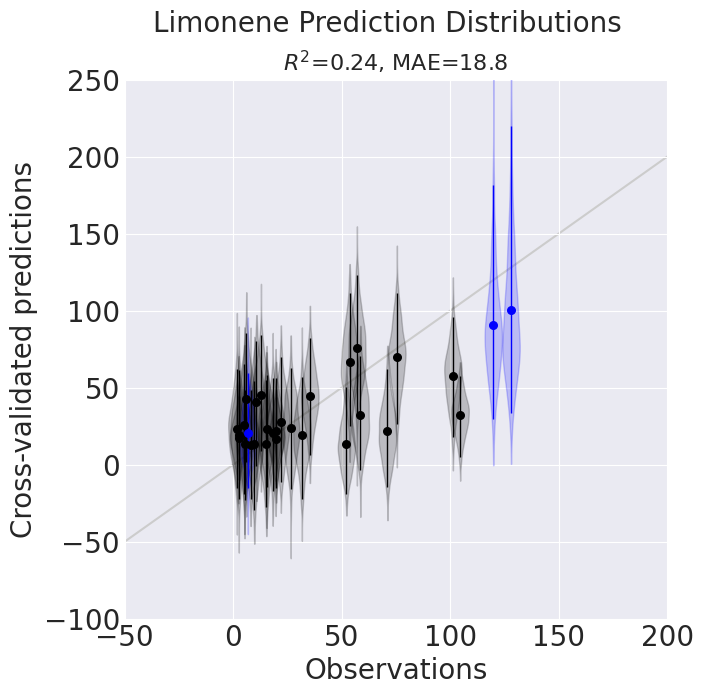

In [12]:
plot.predictions_distr_vs_observations(art, cv=True, widths=8,
                                       X_test=X_test, y_test=y_test,
                                       x_limits=[[-50, 200]], y_limits=[[-100, 250]])

Plot the mean (lower triangle) and standard deviation (upper triangle) of the final model as functions of each pair of input varibles:

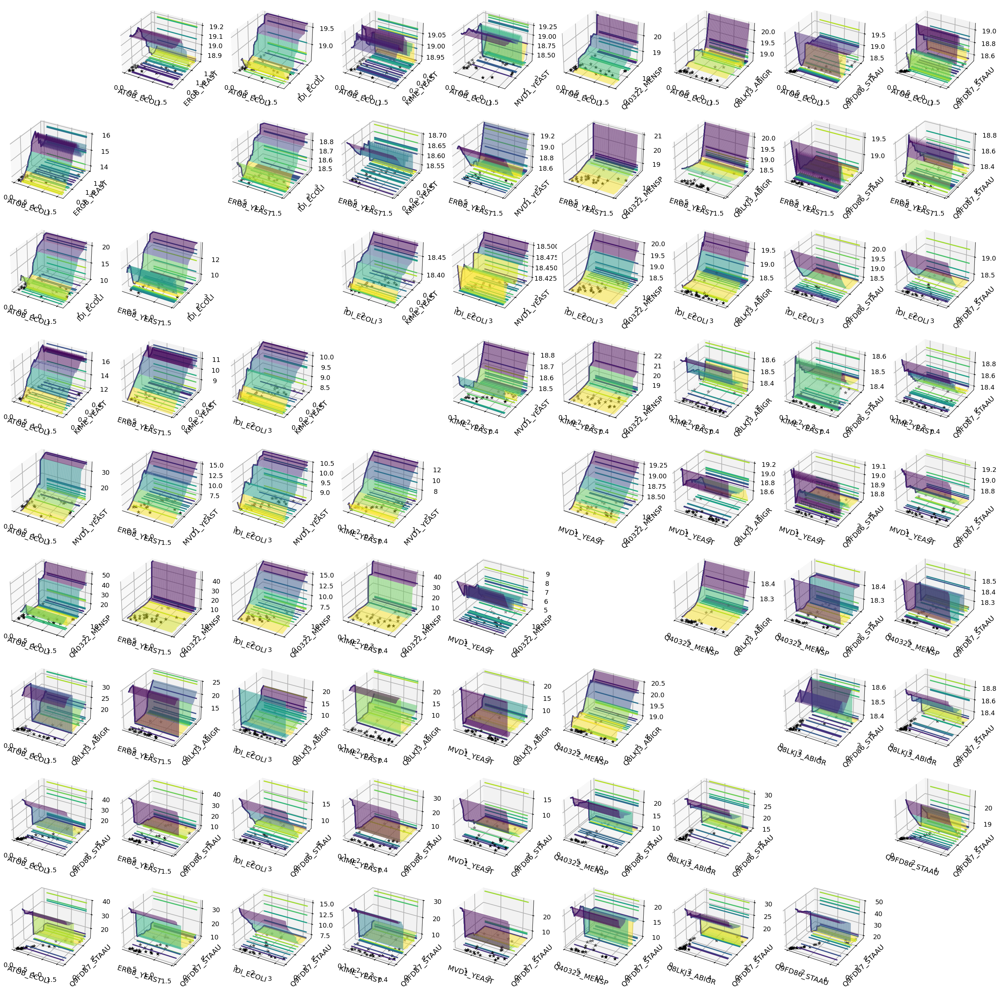

In [13]:
plot.model_pairwise(art)

Sampling-based optimization and generation of recommendations was ran above with the default options (`niter=100000` for number of samples collected, `alpha=None` for a purely exploitative strategy, and `rel_rec_distance=20%` for relative recommendations distance).


In [14]:
os.rename(f'{art.output_dir}/draws_C1.txt',
          f'{art.output_dir}/draws_niter100K_C1.txt')
os.rename(f'{art.output_dir}/recommendations_C1.csv',
          f'{art.output_dir}/recommendations_niter100K_C1.csv')

Alternatively, you can change those parameters to generate recommendations from a longer/shorter sampling run or a different exploration-exploitation strategy:

Starting parallel tempering using 2 chains…
Done with parallel tempering in 3226.44 s
Choosing recommendations (19,800 candidates)…


Done choosing recommendations in 0.03 s


,ATOB_ECOLI,ERG8_YEAST,IDI_ECOLI,KIME_YEAST,MVD1_YEAST,Q40322_MENSP,Q8LKJ3_ABIGR,Q9FD86_STAAU,Q9FD87_STAAU,Limonene
0,0.173906,0.227972,2.630507,0.415739,0.939042,10.615847,4.727649,0.484938,0.581820,109.104049
1,0.217284,0.140649,2.490400,0.410549,1.196129,10.692366,4.729717,0.423534,0.595693,109.089546
2,0.161758,0.136707,2.628789,0.407213,0.374718,10.745209,4.602977,0.535529,0.565670,108.844598
3,0.165456,0.134338,2.477856,0.380671,1.097033,10.625859,4.746070,0.424002,0.632564,108.758571
4,0.162836,0.176061,2.651926,0.402054,0.459781,10.670717,4.611007,0.538489,0.549333,108.707300
5,0.179160,0.169453,2.686742,0.411794,0.613087,10.730881,4.554694,0.524460,0.577692,108.664970
6,0.169746,0.169419,2.542214,0.381212,1.092275,10.627275,4.747712,0.427994,0.648280,108.552177
7,0.176079,0.247985,2.730281,0.413925,0.496310,10.117330,4.702197,0.485956,0.589690,108.526207
8,0.179377,0.256169,2.727569,0.411629,0.724216,10.264656,4.664391,0.429149,0.679814,108.339474
9,0.179516,0.171370,2.947226,0.407260,0.764019,9.940653,4.716933,0.496529,0.578858,108.335936


Computing success probabilities…
Sampling posterior predictive distributions…


Sampling: [y]
Sampling: [y]


Done sampling in 0.52 s
Done computing success probabilities in 0.53 s
Sampling posterior predictive distributions…
Done sampling in 0.51 s


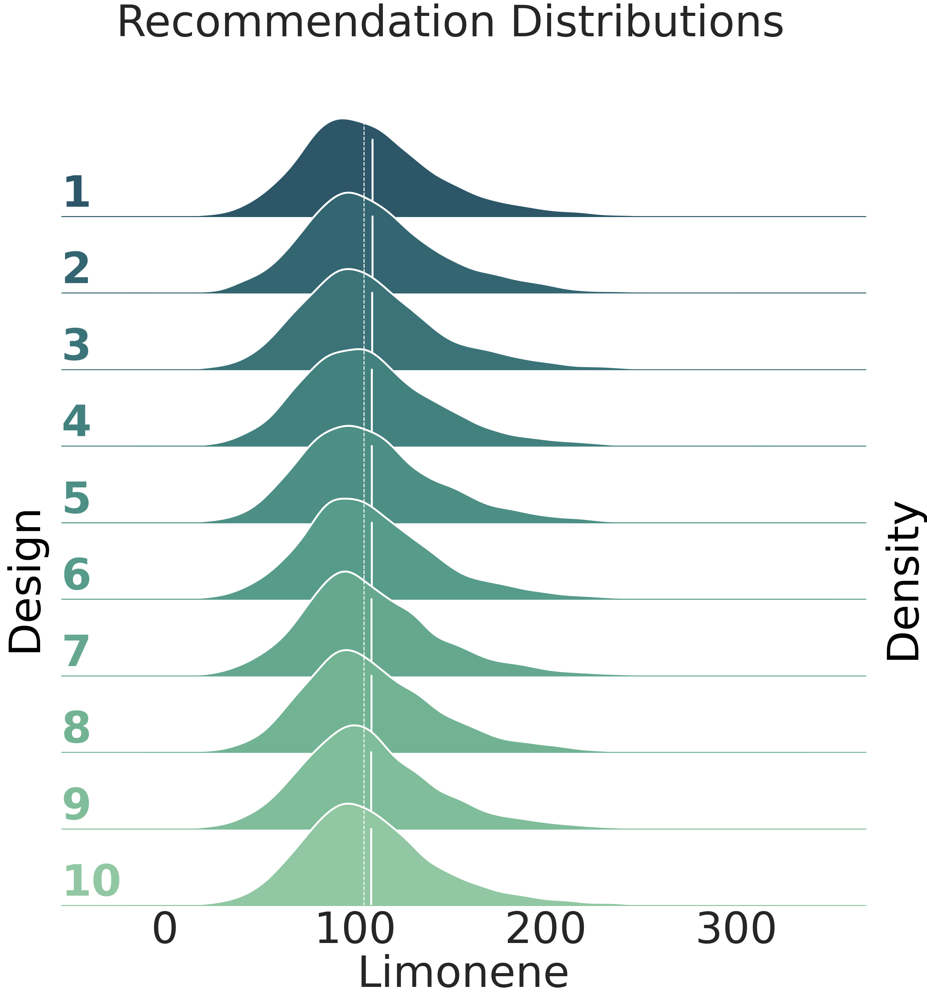

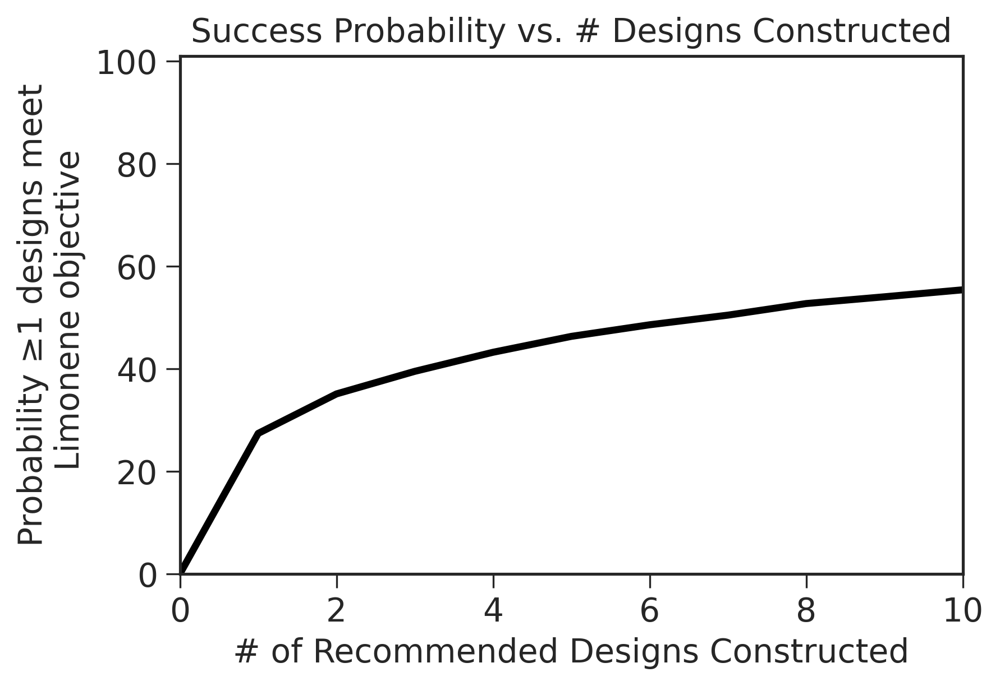

In [15]:
art.niter = 1000000
art.recommend()

Calculate and visualize the success probabilities if the recommended strains are being engineered.

Sampling: [y]


Computing success probabilities…
Sampling posterior predictive distributions…
Done sampling in 0.55 s
Done computing success probabilities in 0.55 s


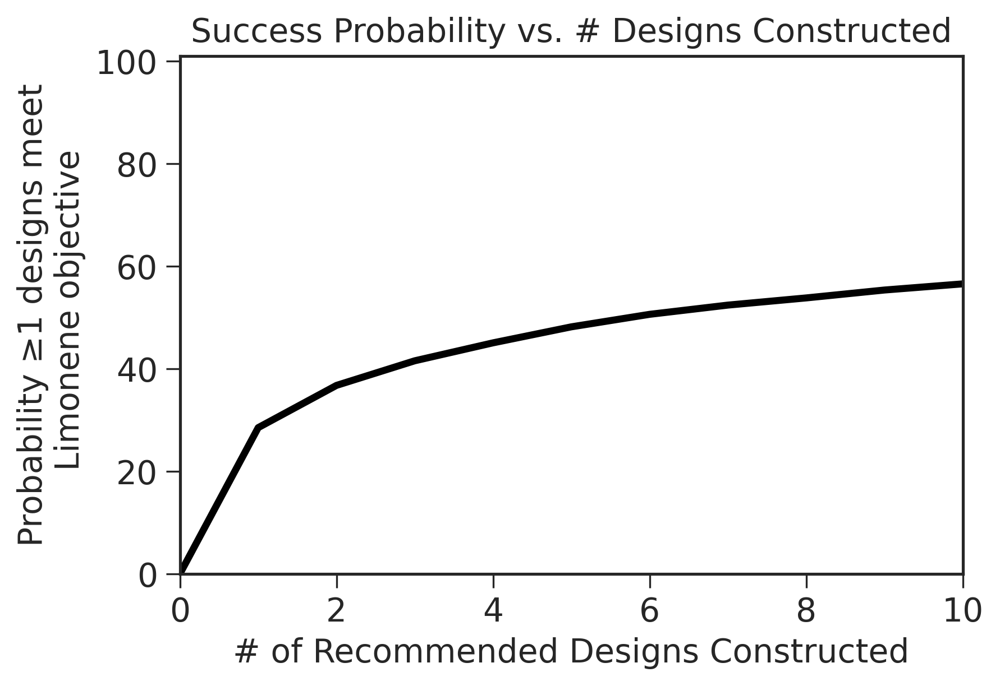

In [16]:
cumulative_success_prob = art.compute_success_prob(current_best=art.find_current_best())
plot.success_prob(art, cumulative_success_prob)

Plot first two principal components of recommendations (in green) with observed data (in red) and test data (yellow)

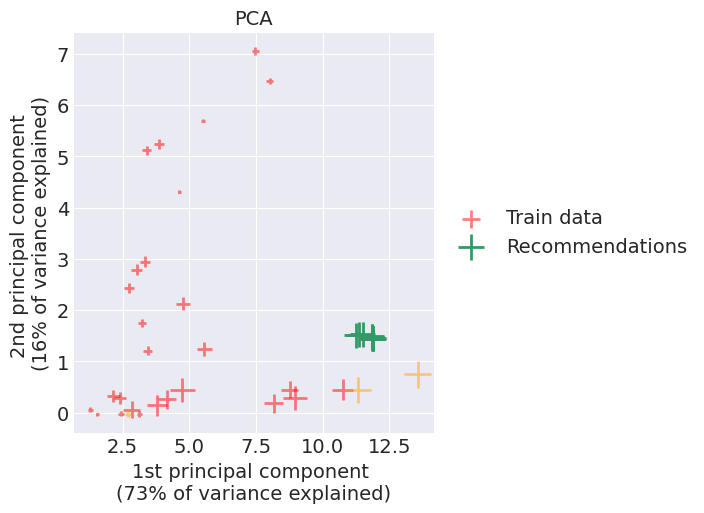

In [17]:
plot.recommendations_pc(art, plot_scale_factor=3, X_test=X_test, objective_value_y_test=y_test)


Heatmap of the mean of the final model as function of the two principal components of input varibles:

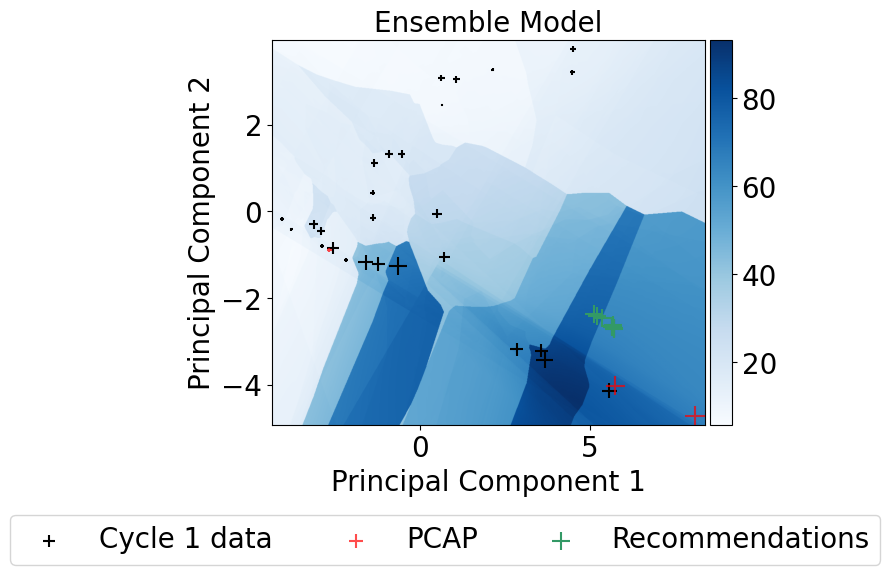

In [18]:
model = art
plot.plot_model(model, art, X_test, y_test, scale_factor=1.05,
                midpoint=0.6,
                title='Ensemble Model', plot_points=True)


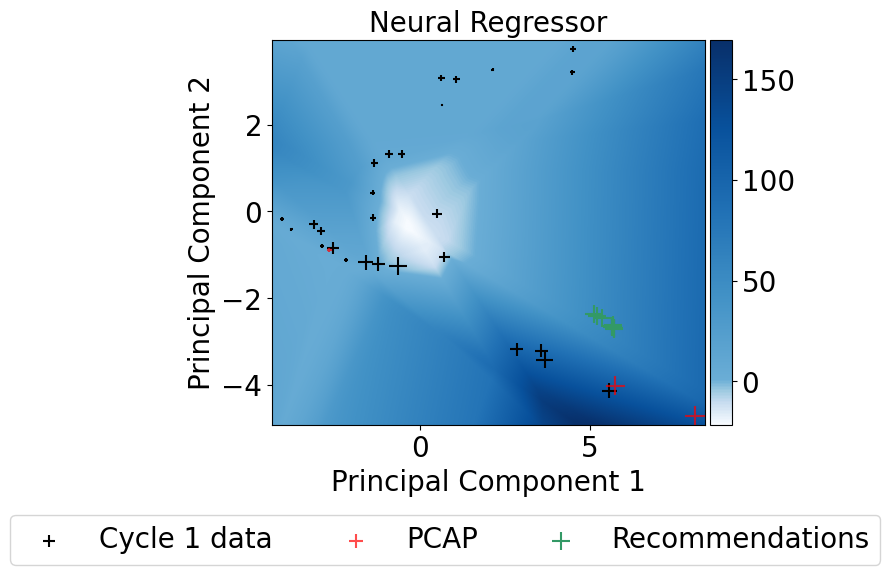

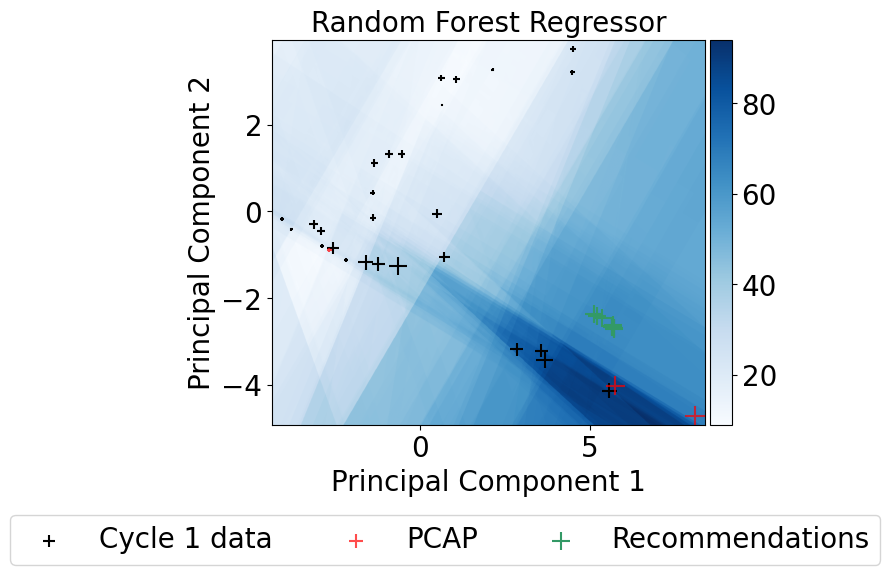

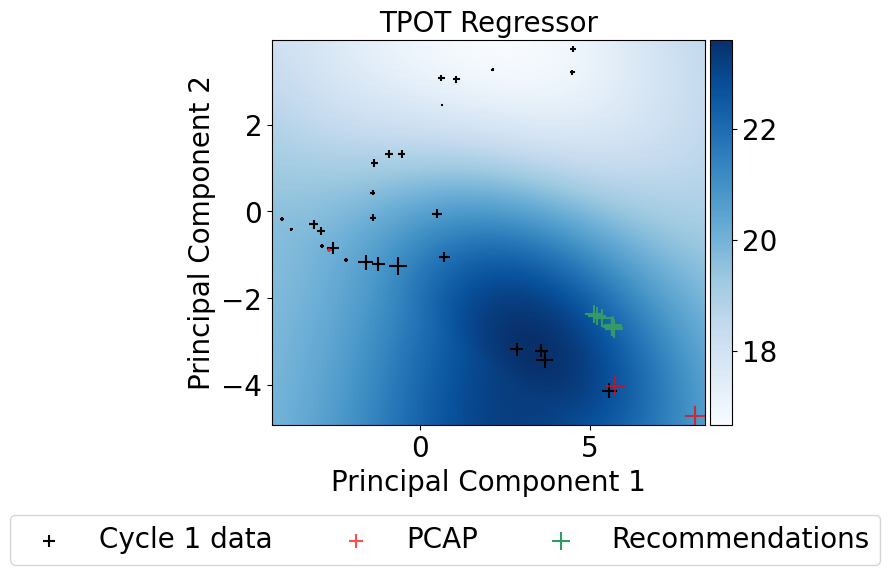

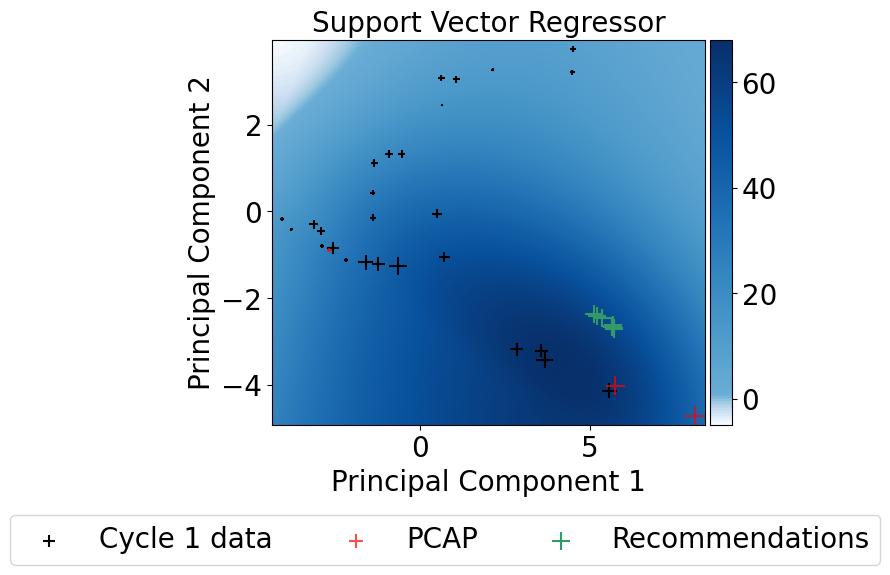

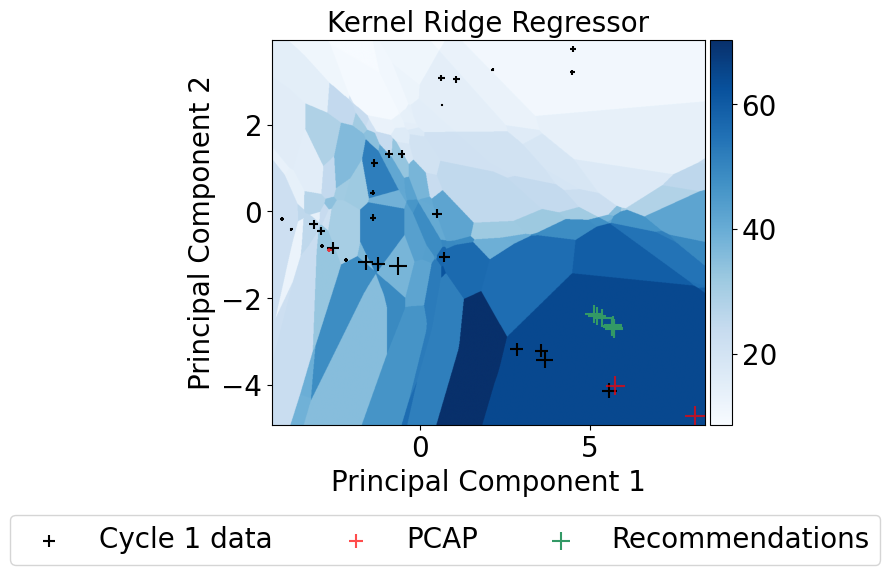

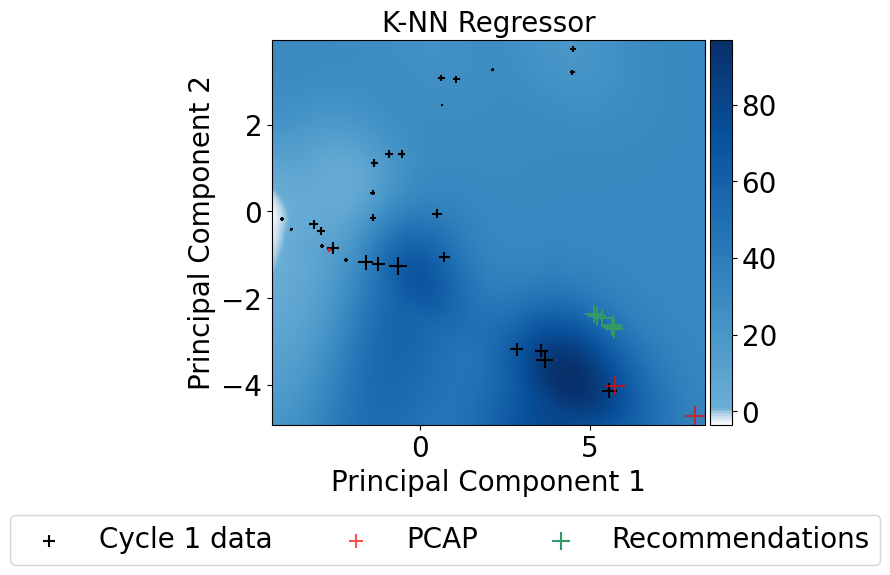

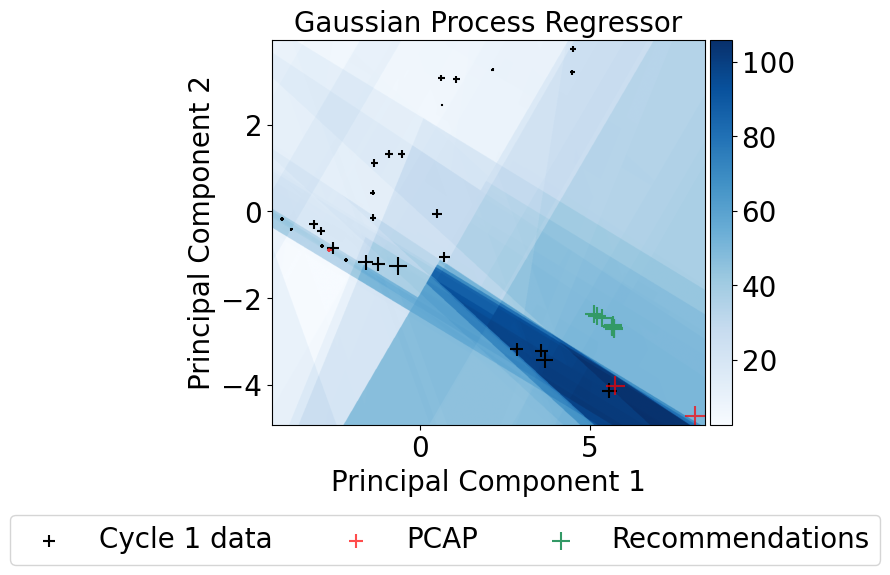

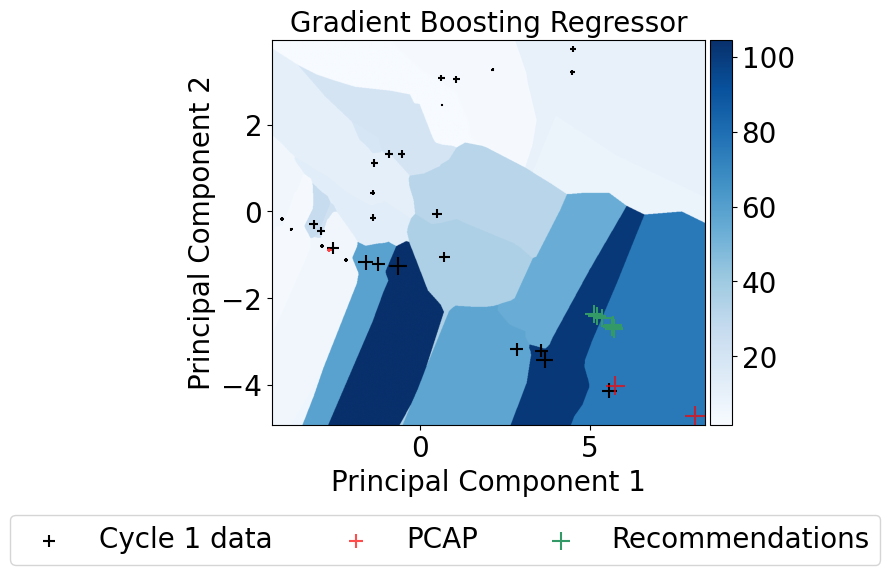

In [19]:
titles = ['Neural Regressor',
          'Random Forest Regressor',
          'TPOT Regressor',
          'Support Vector Regressor',
          'Kernel Ridge Regressor',
          'K-NN Regressor',
          'Gaussian Process Regressor',
          'Gradient Boosting Regressor']

for model,title in zip(art.l0_learners.model_dfs[0]['Model'][:],titles):
    plot.plot_model(model, art, X_test, y_test, scale_factor=1.05,
        midpoint=0.6, title=title, plot_points=True, training_data_label="Cycle 1 Data",
        test_data_label="PCAP"
    )


Visualize input data pairwise. The size of each point represents the level of output variable (limonene production).

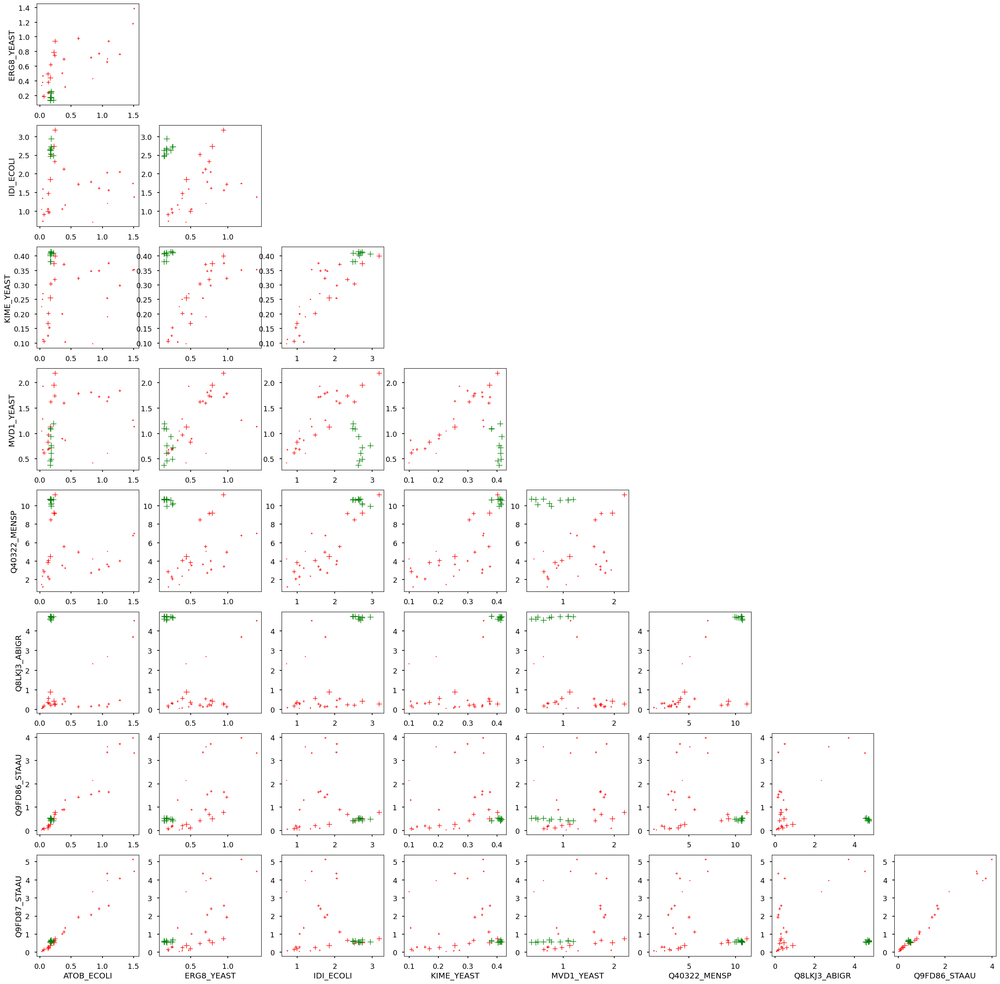

In [20]:
plot.data_pairwise(art, recommendations=art.recommendations)

In [21]:
art.save()

## Recommend strains for the next DBTL cycle

Repeat the process by including all data points.

In [22]:
art_params['build_model'] = True
art_params['result_suffix'] = '_C2'

ART identified 30 unique designs in the training data. 
Correctly communicating your designs is critical to building ART's model and to cross-validation.  We strongly suggest verifying ART's interpretation of your designs by inspecting the preprocessed DataFrame.  For example, if your ART instance is named `engine`, run `engine.df["Design"]`.  See Data Preparation docs for a description of how ART infers design information. https://lbl-biosci.gitlab.io/ese/art/Data_Preparation/#labeling-lines-designs-replicates-oh-my
Cross-validating models…
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_cla

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 15.26 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: KNeighborsRegressor(CombineDFs(input_matrix, CombineDFs(input_matrix, Nystroem(input_matrix, g

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 16 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 16.87 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: RidgeCV(VarianceThreshold(PolynomialFeatures(input_matrix, degree=2, include_bias=False, inter

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 16 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 16.76 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: ElasticNetCV(FastICA(ZeroCount(KNeighborsRegressor(input_matrix, n_neighbors=2, p=1, weights=d

/app.venv/lib/python3.12/site-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.800e+02, tolerance: 2.352e+01
  model = cd_fast.enet_coordinate_descent(
/app.venv/lib/python3.12/site-packages/sklearn/decomposition/_fastica.py:127: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  warnings.warn(


Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 16 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 16.99 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: LinearSVR(StandardScaler(DecisionTreeRegressor(PolynomialFeatures(input_matrix, degree=2, incl

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 13 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 13.38 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: RidgeCV(ExtraTreesRegressor(PolynomialFeatures(AdaBoostRegressor(input_matrix, learning_rate=0

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 10 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 10.35 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: LinearSVR(SelectPercentile(input_matrix, percentile=87), C=0.1, dual=False, epsilon=0.1, loss=

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 13 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 13.17 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: RidgeCV(SelectPercentile(DecisionTreeRegressor(input_matrix, max_depth=2, min_samples_leaf=12,

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 15 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 15.90 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: ElasticNetCV(AdaBoostRegressor(RBFSampler(input_matrix, gamma=0.05), learning_rate=1.0, loss=s

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 12 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 12.99 s
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: ElasticNetCV(OneHotEncoder(SelectFwe(PCA(LinearSVR(input_matrix, C=25.0, dual=False, epsilon=0

/app.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


Done fitting L0 models in 105.77 s


/app.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/app.venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/app.venv/lib/python3.12/site-

Building ensemble model (2 sampling jobs)…


Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 13 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 13.94 s
Done with 10-fold cross-validation in 1216.20 s


,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,20.782088,110.283274,20.956429,871.067092,0.354675
Random Forest Regressor,20.436774,198.433803,16.893312,703.045728,0.479153
Support Vector Regressor,27.350860,167.500699,29.190907,1600.178560,-0.185483
Kernel Ridge Regressor,20.304178,115.537782,23.297712,955.043003,0.292462
K-NN Regressor,18.444413,150.032013,17.981583,663.533698,0.508425
Gaussian Process Regressor,21.212298,156.443042,21.891750,929.210278,0.311600
Gradient Boosting Regressor,17.457785,151.286859,18.914139,662.518932,0.509177
TPOT Regressor,17.966863,128.067045,17.975194,645.915765,0.521477
Ensemble Model (L1),15.762443,112.512294,12.990763,417.214537,0.690909


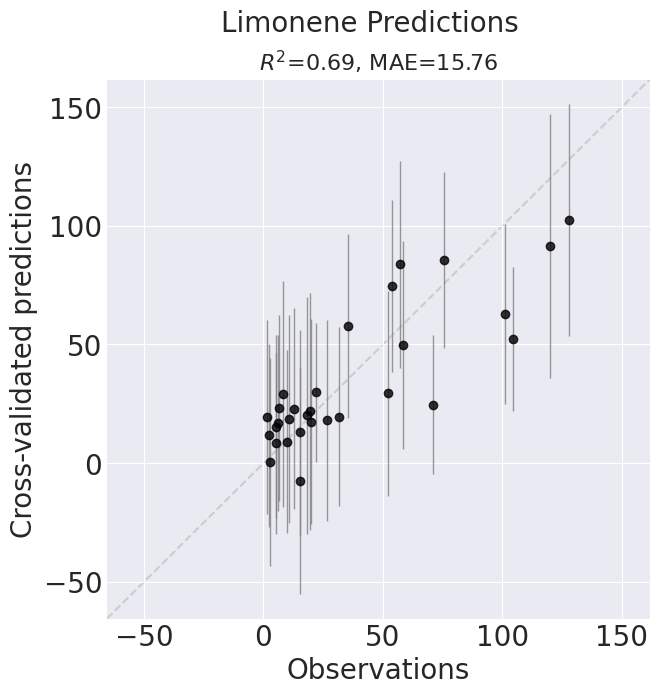

Building models…
Fitting L0 models…
Building TPOT models…
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
is_classifier
is_regressor
Best pipeline: RidgeCV(PolynomialFeatures(Nystroem(input_matrix, gamma=0.2, kernel=additive_chi2, n_components=6), degree=2, include

Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, omegas]


Output()

Sampling 2 chains for 1_000 tune and 10_000 draw iterations (2_000 + 20_000 draws total) took 16 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Done building ensemble model in 16.42 s


,MAE,MRAE(%),StdAE,MSE,$R^2$
Name,,,,,
Neural Regressor,0.097560,0.990360,0.222568,0.059054,0.999956
Random Forest Regressor,7.305192,67.929802,5.494255,83.552660,0.938101
Support Vector Regressor,25.816751,151.889853,28.865585,1499.726588,-0.111063
Kernel Ridge Regressor,12.574144,82.423719,11.951892,300.956820,0.777038
K-NN Regressor,14.385255,102.244064,14.015780,403.377638,0.701160
Gaussian Process Regressor,10.803244,92.259785,10.408810,225.053424,0.833271
Gradient Boosting Regressor,0.103705,1.008630,0.083743,0.017768,0.999987
TPOT Regressor,6.389823,44.356632,5.341244,69.358731,0.948616
Ensemble Model (L1),5.783839,38.685445,5.424280,62.875610,0.953419


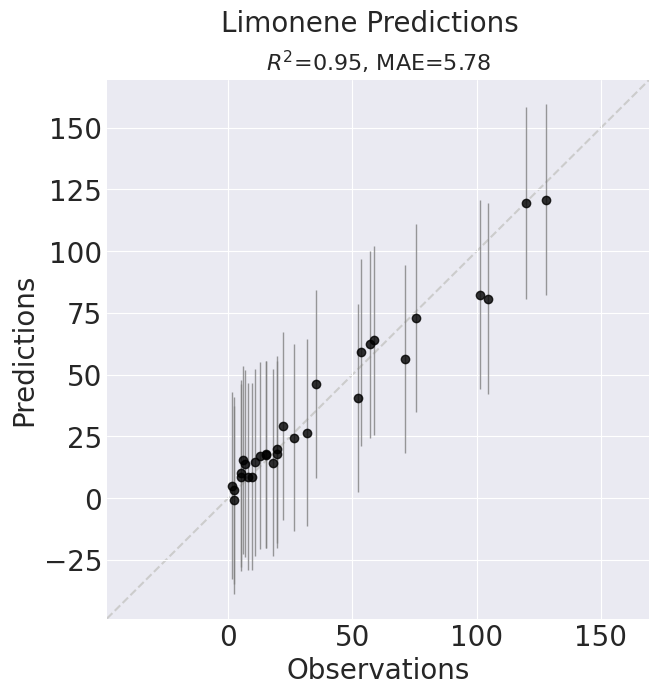

Done building models in 103.96 s
Starting parallel tempering using 2 chains…
Done with parallel tempering in 258.72 s
Choosing recommendations (19,800 candidates)…


Done choosing recommendations in 0.80 s


,ATOB_ECOLI,ERG8_YEAST,IDI_ECOLI,KIME_YEAST,MVD1_YEAST,Q40322_MENSP,Q8LKJ3_ABIGR,Q9FD86_STAAU,Q9FD87_STAAU,Limonene
0,0.211299,0.138737,3.290742,1.462068,0.239570,14.187116,4.744310,0.450468,0.539300,225.082835
1,0.212444,0.151741,3.220702,1.490858,0.290935,14.217394,4.721188,0.424831,0.544862,224.725687
2,0.212409,0.133408,3.297484,1.141026,0.237807,14.153726,4.724768,0.426785,0.543354,223.825280
3,0.208641,0.162837,3.209676,1.480976,0.355077,14.212770,4.710026,0.419592,0.539561,223.739800
4,0.216615,0.207630,3.234666,1.486550,0.278113,14.190304,4.730924,0.419123,0.547065,223.340872
5,0.261277,0.131643,3.258520,1.428729,0.240395,14.172815,4.749378,0.430290,0.539081,222.797587
6,0.221541,0.135802,3.294903,1.087243,0.308696,14.186308,4.749309,0.422410,0.544981,222.601078
7,0.208902,0.163456,3.289230,1.006547,0.267070,14.212523,4.749187,0.419427,0.559914,222.280641
8,0.260154,0.137972,3.221118,1.454710,0.295844,14.213588,4.739115,0.421367,0.550479,222.197538
9,0.213936,0.146867,3.286616,1.343934,0.446484,14.194492,4.737306,0.417453,0.542093,222.067925


Sampling: [y]


Computing success probabilities…
Sampling posterior predictive distributions…


Sampling: [y]


Done sampling in 0.50 s
Done computing success probabilities in 0.50 s
Sampling posterior predictive distributions…
Done sampling in 0.51 s


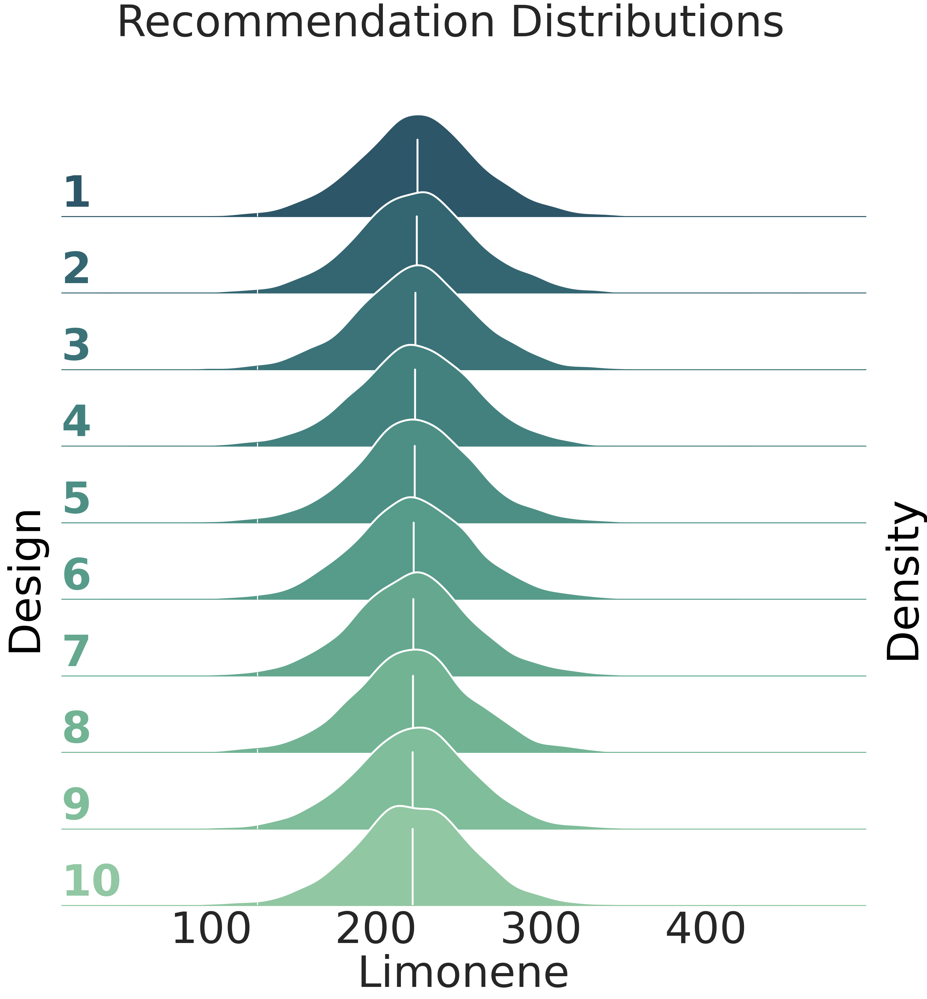

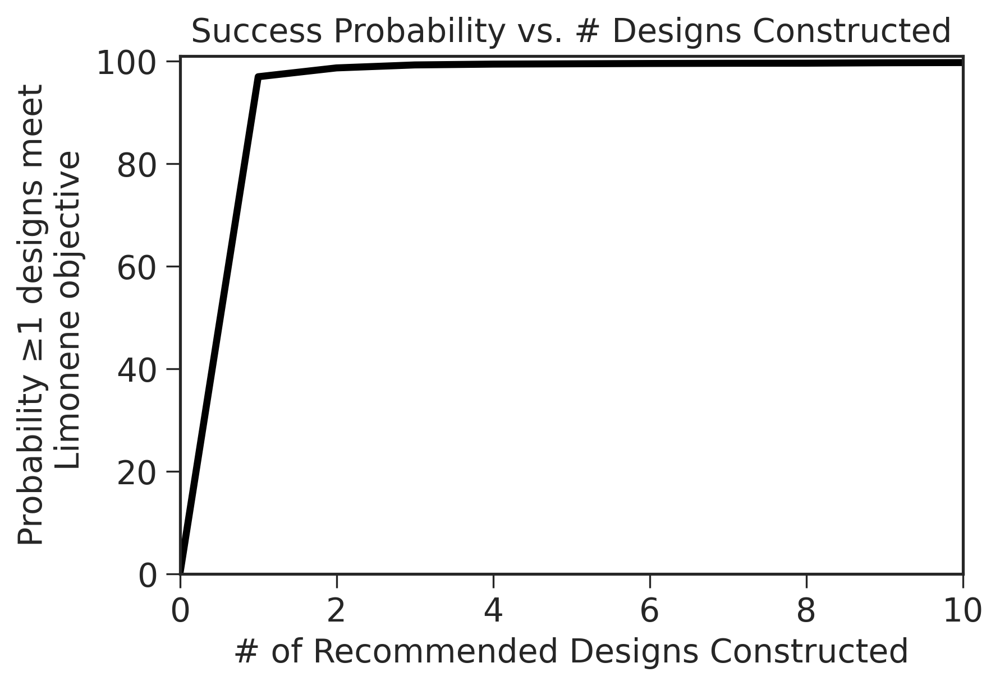

In [23]:
art2 = RecommendationEngine(df=df, **art_params)

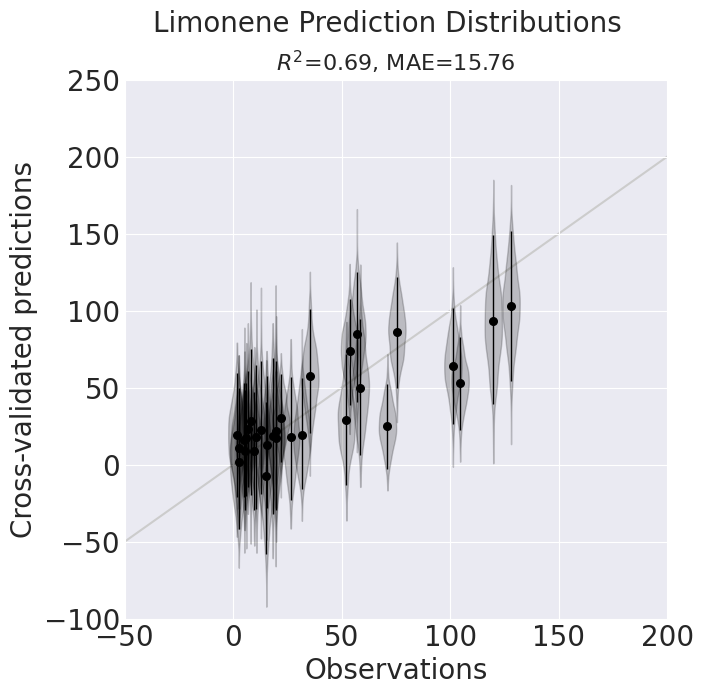

In [24]:
plot.predictions_distr_vs_observations(art2, cv=True, widths=8,
                                       x_limits=[[-50, 200]], y_limits=[[-100, 250]])


Sampling: [y]


Sampling posterior predictive distributions…
Done sampling in 0.51 s


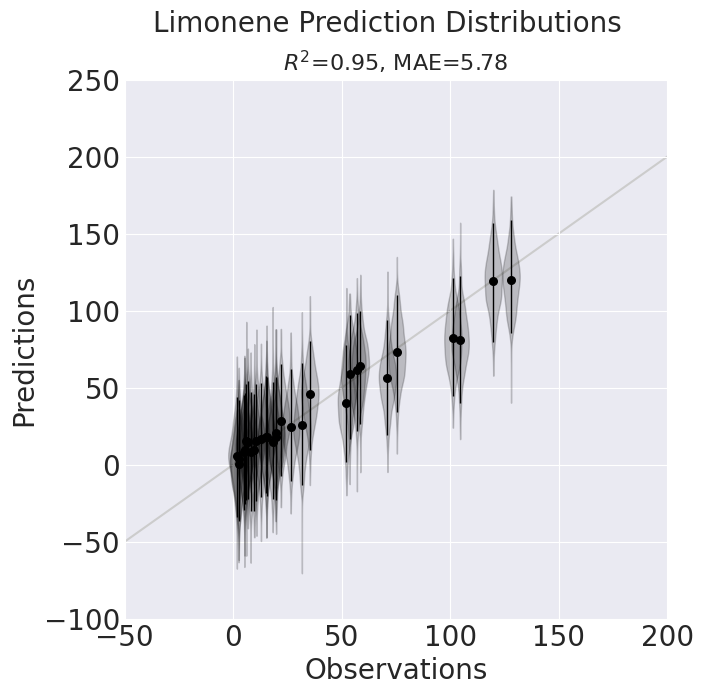

In [25]:
plot.predictions_distr_vs_observations(art2, cv=False, widths=8,
                                       x_limits=[[-50, 200]], y_limits=[[-100, 250]])


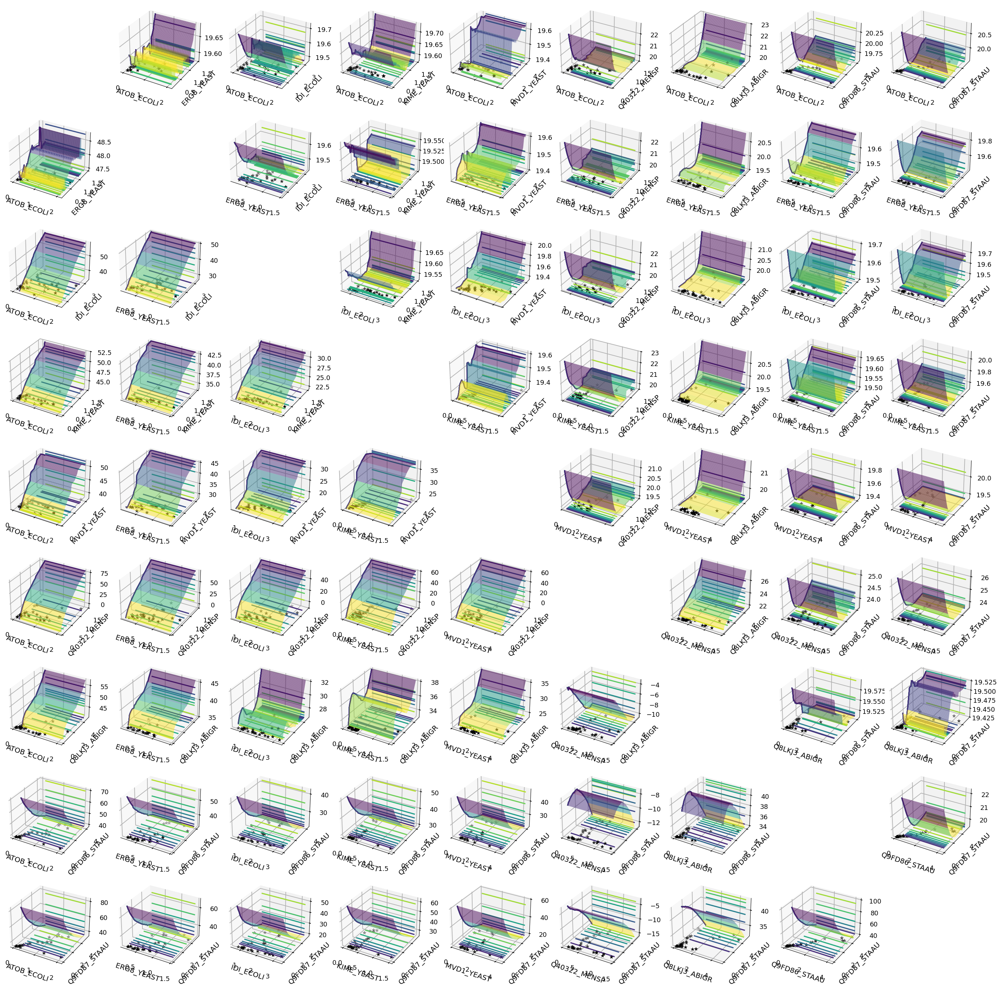

In [26]:
plot.model_pairwise(art2)

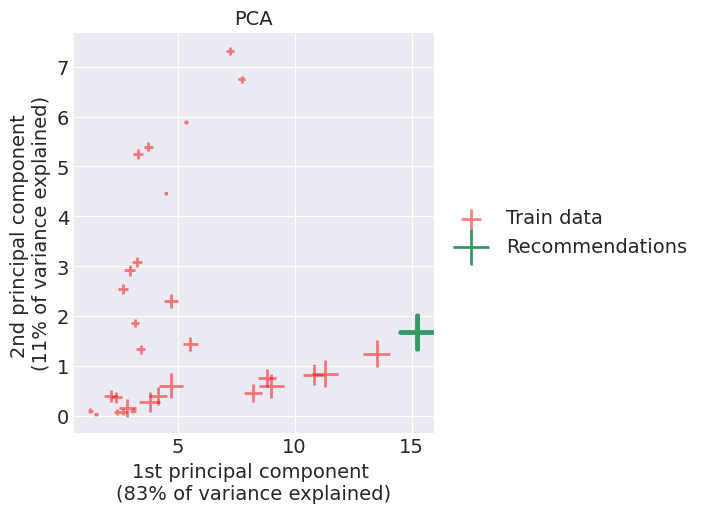

In [27]:
plot.recommendations_pc(art2, plot_scale_factor=3)


In [28]:
model = art2
plot.plot_model(
    model,
    art2,
    scale_factor=1.05,
    midpoint=0.6,
    title='Ensemble Model', plot_points=True,
    training_data_label="Cycle 1 Data", test_data_label="PCAP"
)

TypeError: plot_model() missing 2 required positional arguments: 'X_test' and 'y_test'